In [1]:
#code to read in multiple fits files and merge them to one multifreq fits file

In [2]:
import healpy as hp
import numpy as np
from astropy.io import fits
import matplotlib.pyplot as plt
import matplotlib.cm as cm

In [3]:
#first read in each individual fits file
#set up the frequencies
freqarray=np.array([133,136,137,141,146,148,151,156,161,166,220])

In [4]:
#create the fits files
theta=np.zeros((len(freqarray),992,9))
phi=np.zeros((len(freqarray),992,9))
val=np.zeros((len(freqarray),992,9))

for i in range (len(freqarray)):
    fstring=str(freqarray[i])
    hdul = fits.open('synthbeam_fits_files/CalQubic_Synthbeam_Analytical_'+fstring+'_FI.fits')
    theta[i,:,:]=hdul[0].data
    phi[i,:,:]=hdul[1].data
    val[i,:,:]=hdul[2].data

In [5]:
#now need to save the files
new_hdul = fits.HDUList()
new_hdul.append(fits.ImageHDU(theta))
new_hdul.append(fits.ImageHDU(phi))
new_hdul.append(fits.ImageHDU(val))
new_hdul.append(fits.ImageHDU(freqarray))
    
new_hdul.writeto('CalQubic_Synthbeam_Analytical_'+'Multifreq'+'_MJW_FI.fits', overwrite=True)

In [6]:
#lets try reading and plotting this
hdul = fits.open('CalQubic_Synthbeam_Analytical_Multifreq_MJW_FI.fits')

In [7]:
theta[:,:,:]=hdul[0].data
phi[:,:,:]=hdul[1].data
val[:,:,:]=hdul[2].data
freqarray=hdul[3].data

In [8]:
print(freqarray)

[133 136 137 141 146 148 151 156 161 166 220]


/var/folders/mj/qlb3tvls0z96hcwcvthjbwj80000hb/T/ipykernel_41917/3716371980.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()


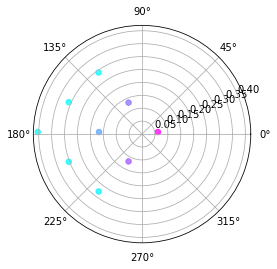

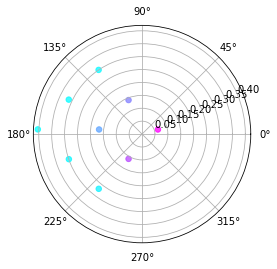

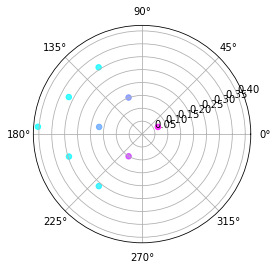

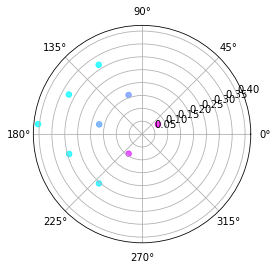

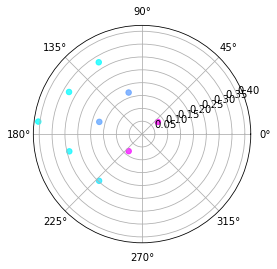

...

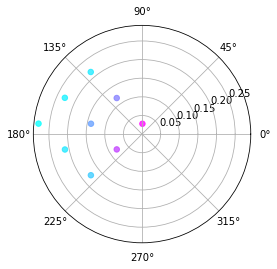

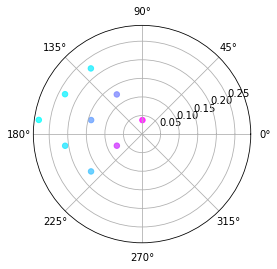

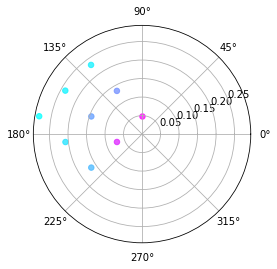

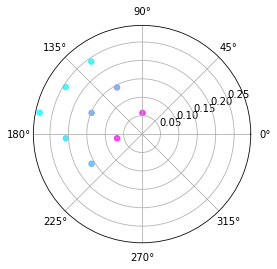

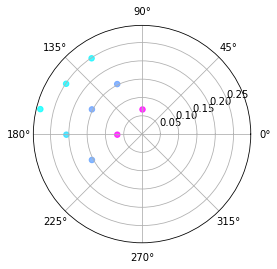

In [9]:
for i in range(len(freqarray)):
    for j in range (35):
        fig = plt.figure()
        ax = fig.add_subplot(projection='polar')
        c = ax.scatter(phi[i,j,:],theta[i,j,:] , c=val[i,j,:], s=30, cmap='cool', alpha=0.75)